## Final - Part A2: Gentrification Indexing
#### Notebook: Miles Cressy | Group: Race as Vulnerability: The Relationship between Policing and Gentrification

This notebook represents the final iteration of Part A for the project: "Race as Vulnerability: The Relationship between Policing and Gentrification". This notebook first captures the code and visualizations associated with the aggregation of various metrics that our team has determined represent significant indicators of gentrifying forces. Following the evaluation of these measures of gentrification, the notebook attempts to define an index for gentrification by combining the aforementioned metrics to serve as an underlay for police data.
__________________________________________________________________________________________________________________________________________________________________________________________________

Import various packages for data manipulation/cleaning and visualization.

In [216]:
# standard data manipulation
import pandas as pd
import numpy as np
# geospatial data manipulation/visualization
import geopandas as gpd
import plotly as pl
import plotly.express as px
import plotly.graph_objects as go
import libpysal as lp
import contextily as ctx
import json
import seaborn as sns
import plotly.offline as pyo

# advanced graph visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import LinearLocator

# To ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [117]:
# import demographic csv file data from 2017 Census, rename FIPS column for merge and add a leading zero.
tracts_race_17 = pd.read_csv('data/race_2017.csv', dtype = {'fips':str})
tracts_race_17.rename(columns={'fips': 'FIPS'}, inplace=True)
tracts_race_17['FIPS'] = tracts_race_17['FIPS'].str.zfill(11)

# import demographic csv file data from 2021 Census, rename some columns for merge and add a leading zero.
tracts_race_21 = pd.read_csv('data/rent_burden_ct_1.csv',dtype = {'Geo_FIPS':str})
tracts_race_21.rename(columns={'total_housing_units': 'total','white_alone':'white','black_alone':'black','asian_alone':'asian' }, inplace=True)
tracts_race_21['FIPS'] = tracts_race_21['Geo_FIPS'].str.zfill(11)

# import LA neighborhoods from ArcGIS
nbh = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

In [118]:
#check 2017 dataframe
tracts_race_17.head()

,FIPS,total,white,black,american_indian,asian,hawaiian,other,two_or_more,white_not_hispanic,hispanic
0,06037101110,816,587,26,0,19,0,155,29,483,282
1,06037101122,230,211,0,0,19,0,0,0,177,34
2,06037101210,1975,1551,69,0,61,0,272,22,987,836
3,06037101220,808,532,11,0,112,0,90,63,428,177
4,06037101300,171,112,0,0,25,0,26,8,112,34


In [119]:
#check 2021 dataframe
tracts_race_21.head()

,Geo_FIPS,total,white,black,american_indian_alone,asian,native_hawaiian_alone,other,two_or_more,white_alone_not_hisp,hispanic,total_pop,rent_burden,FIPS
0,6037101110,644,438,0,0,58,0,52,96,372,207,3879,0.549689,06037101110
1,6037101122,344,287,0,0,0,0,33,24,287,33,4247,0.706395,06037101122
2,6037101220,762,450,8,16,48,0,110,130,394,285,3583,0.535433,06037101220
3,6037101221,1140,815,68,0,25,0,178,54,747,269,3723,0.663158,06037101221
4,6037101222,816,715,17,0,28,17,28,11,515,239,2690,0.651961,06037101222


Our two dataframes contain census tract identifiers, along with values for each category of race for renter-occupied households. We will subset our race dataframes to only contain the major racial groups as this will simplify our analysis but keep our results and conclusions nearly the same.

In [120]:
#subset dataframes and conduct additional review
tracts_race_17 = tracts_race_17[['FIPS','total','white','black','asian','hispanic']]
tracts_race_21 = tracts_race_21[['FIPS','total','white','black','asian','hispanic']]

In [121]:
#review subsetted dataframe
tracts_race_17.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   FIPS      2346 non-null   object
 1   total     2346 non-null   int64 
 2   white     2346 non-null   int64 
 3   black     2346 non-null   int64 
 4   asian     2346 non-null   int64 
 5   hispanic  2346 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 110.1+ KB


In [122]:
#review subsetted dataframe
tracts_race_21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   FIPS      2498 non-null   object
 1   total     2498 non-null   int64 
 2   white     2498 non-null   int64 
 3   black     2498 non-null   int64 
 4   asian     2498 non-null   int64 
 5   hispanic  2498 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 117.2+ KB


It is important to note that the Census was conducted in 2020, meaning the census tract boundaries are either different or have completely changed in some cases. We wanted to ensure that we had a good historical coverage to view demographic shifts through but we are doing so at the cost of lost observations due to dissimilar census tracts.

In [123]:
#merge census tract dataframes from both years on FIPS, then review data
race_merge = tracts_race_17.merge(tracts_race_21, on='FIPS',
                                  suffixes=('_2017', '_2021'),
                                 indicator=True)
race_merge.describe()

,total_2017,white_2017,black_2017,asian_2017,hispanic_2017,total_2021,white_2021,black_2021,asian_2021,hispanic_2021
count,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000
mean,727.787339,371.790307,85.225519,91.897626,322.763600,732.410979,327.737389,83.417903,91.102374,329.230465
std,478.751748,337.873194,143.152049,139.897347,258.725869,493.469446,324.412235,139.688290,137.745780,259.052992
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,364.000000,147.000000,0.000000,7.000000,105.000000,356.500000,119.000000,0.000000,7.000000,114.000000
50%,662.000000,275.500000,32.000000,41.000000,267.000000,660.500000,230.000000,33.000000,41.000000,274.000000
75%,991.500000,497.000000,101.750000,115.000000,498.000000,1009.000000,421.000000,104.000000,117.750000,509.750000
max,3879.000000,3217.000000,1587.000000,1257.000000,1209.000000,3895.000000,2868.000000,1218.000000,1442.000000,1326.000000


After merging to ensure that all similar census tracts were accounted for, we will separate the dataframe by year, add a year column and then append them together in order to create a longer (rather than a wider) dataframe.

In [124]:
# now disaggregatge to make the dataset long instead of wide to prepare for appending
ct_21 = race_merge[['FIPS','total_2021','white_2021','black_2021', 'asian_2021', 'hispanic_2021']]
ct_21.rename(columns={'total_2021': 'total','white_2021':'white','black_2021':
                               'black','asian_2021':'asian','hispanic_2021':'hispanic' }, inplace=True)
ct_17 = race_merge.drop(columns=['_merge','total_2021','white_2021','black_2021', 'asian_2021', 'hispanic_2021'])
ct_17.rename(columns={'total_2017': 'total','white_2017':'white','black_2017':
                               'black','asian_2017':'asian','hispanic_2017':'hispanic' }, inplace=True)

In [125]:
# add column for year for each demographic dataset
ct_17['year']=2017
ct_21['year']=2021
# demogaphic information is ready to be appended
ct_race=ct_17.append(ct_21)
# 10 year census tract data for understanding of demograhic shifts, with each shared census tract having two observations (one for 2017 and one for 2021)
ct_race.sort_values(by=['year','FIPS'])
ct_race

,FIPS,total,white,black,asian,hispanic,year
0,06037101110,816,587,26,19,282,2017
1,06037101122,230,211,0,19,34,2017
2,06037101220,808,532,11,112,177,2017
3,06037101300,171,112,0,25,34,2017
4,06037101400,460,364,0,35,216,2017
...,...,...,...,...,...,...,...
2017,06037980031,10,10,0,0,10,2021
2018,06037980033,13,0,0,0,0,2021
2019,06037990100,0,0,0,0,0,2021
2020,06037990200,0,0,0,0,0,2021


Having organized our data appropriately, we will now add in geospatial information so that we can later spatially join the census tracts into the LA neighborhood geodataframe. This will entail bringing in census tract data, adjusting the columns to match our working dataframe and then a merge to join the data together.

In [126]:
# merge in census spatial information
tracts=gpd.read_file('data/Census_Tracts_2020.geojson')
# subset for only relevant information
tracts = tracts[['CT20','geometry']]
# create new column using CT20 column that allows us to merge on FIPS
tracts['FIPS'] ='06' + '037' + tracts['CT20']
# merge now that we have a shared column
spatial_race=tracts.merge(ct_race, on='FIPS')
# double check this worked correctly
spatial_race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 4038 entries, 0 to 4037
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   CT20      4038 non-null   object  
 1   geometry  4038 non-null   geometry
 2   FIPS      4038 non-null   object  
 3   total     4038 non-null   int64   
 4   white     4038 non-null   int64   
 5   black     4038 non-null   int64   
 6   asian     4038 non-null   int64   
 7   hispanic  4038 non-null   int64   
 8   year      4038 non-null   int64   
dtypes: geometry(1), int64(6), object(2)
memory usage: 315.5+ KB


In [127]:
# explore neighborhoods
nbh.head()

,OBJECTID,name,geometry
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,4,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,5,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."


In [17]:
# check coordinate system to ensure they match on join
nbh.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [18]:
# prepare demographic data for spatial join with neighborhoods
# first adjust census data to point data 
spatial_race = spatial_race.to_crs(4326)
spatial_race['Centroid']=spatial_race.to_crs('+proj=cea').centroid.to_crs(spatial_race.crs)
spatial_race_1 = spatial_race.to_crs(4326)
spatial_race_1 = spatial_race_1.drop(columns=['CT20','geometry'])
spatial_race_1.rename(columns={'Centroid': 'geometry'}, inplace=True)
spatial_race_1.head(20)

,FIPS,total,white,black,asian,hispanic,year,geometry
0,06037101110,816,587,26,19,282,2017,POINT (-118.29300 34.25948)
1,06037101110,644,438,0,58,207,2021,POINT (-118.29300 34.25948)
2,06037101122,230,211,0,19,34,2017,POINT (-118.29016 34.26773)
3,06037101122,344,287,0,0,33,2021,POINT (-118.29016 34.26773)
4,06037101220,808,532,11,112,177,2017,POINT (-118.28164 34.25161)
5,06037101220,762,450,8,48,285,2021,POINT (-118.28164 34.25161)
6,06037101300,171,112,0,25,34,2017,POINT (-118.27101 34.24878)
7,06037101300,242,170,0,0,52,2021,POINT (-118.27101 34.24878)
8,06037101400,460,364,0,35,216,2017,POINT (-118.29417 34.24286)
9,06037101400,387,353,0,34,68,2021,POINT (-118.29417 34.24286)


Now that the race data is cleaned and prepped, we will run a spatial join on the race data (now with census tract centroids) and the neighborhood polygon data.

In [19]:
# spatial join
nbh_race = nbh.sjoin(spatial_race_1, how="left")
nbh_race.sort_values(by=['FIPS','year'])
nbh_race.head()

,OBJECTID,name,geometry,index_right,FIPS,total,white,black,asian,hispanic,year
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1225,06037221601,796,222,152,26,585,2021
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1222,06037221500,1031,161,453,34,513,2017
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1223,06037221500,850,215,283,68,416,2021
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1241,06037222100,795,216,196,32,495,2021
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1240,06037222100,782,111,281,79,379,2017


Now that we've successfully joined the dataframes, let's organize our new geodataframe, create new columns based on the metric we're interested in analyzing and then sort by those new columns.

In [20]:
# collapse by year and neighborhood
nbhr = nbh_race.groupby(['year','name'],
                                           as_index=False).agg(geometry = ('geometry','first'),
                                                               total = ('total','sum'),
                                                               white = ('white','sum'),
                                                               black = ('black','sum'),
                                                               asian = ('asian','sum'),
                                                               hispanic = ('hispanic','sum')
                                                              )
nbhr = nbhr.sort_values(by=['name','year'])
nbhr.head(20)

,year,name,geometry,total,white,black,asian,hispanic
0,2017,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4187,713,1332,402,2151
114,2021,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4246,1132,930,472,2460
1,2017,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",848,487,11,72,696
115,2021,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",723,368,0,38,626
2,2017,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",5181,1217,983,994,2858
116,2021,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",5179,1232,1203,831,2596
3,2017,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",2565,1466,18,438,855
117,2021,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",2803,1466,8,565,862
4,2017,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",4428,710,3194,153,796
118,2021,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",4388,530,2908,192,1070


Now that our geodataframe is organized appropriately, we will generate new columns based on white and black demographic shifts. Before doing so, considering we no longer have use for our 2017 data, we will drop those rows along with any 2021 rows that have missing data. We will then generate a new column that evaluates the differential between the black and white renter population shift as a way to measure the neighborhoods experiencing the greatest change - we will sort our dataframe by this value and produce a bar chart that visualizes this.

In [21]:
# row calculations to determine % shifts in renter-occupied household demographics
nbhr['delta_b'] = nbhr['black'].div(nbhr.groupby('name')['black'].shift())
nbhr['delta_b_perc'] = nbhr['delta_b']*100
nbhr['delta_w'] = nbhr['white'].div(nbhr.groupby('name')['white'].shift())
nbhr['delta_w_perc'] = nbhr['delta_w']*100
# add column which accounts for the % change in demographic shift between white and black renters 
nbhr['Percent Differential'] = nbhr.delta_w_perc - nbhr.delta_b_perc
#check column
nbhr

,year,name,geometry,total,white,black,asian,hispanic,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential
0,2017,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4187,713,1332,402,2151,NaN,NaN,NaN,NaN,NaN
114,2021,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4246,1132,930,472,2460,0.698198,69.819820,1.587658,158.765778,88.945959
1,2017,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",848,487,11,72,696,NaN,NaN,NaN,NaN,NaN
115,2021,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",723,368,0,38,626,0.000000,0.000000,0.755647,75.564682,75.564682
2,2017,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",5181,1217,983,994,2858,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,2021,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",1863,546,134,833,334,0.644231,64.423077,1.056093,105.609284,41.186207
112,2017,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",5304,2033,369,732,2800,NaN,NaN,NaN,NaN,NaN
226,2021,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",5510,1741,300,630,3170,0.813008,81.300813,0.856370,85.636990,4.336177
113,2017,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",7849,5761,504,797,968,NaN,NaN,NaN,NaN,NaN


In [22]:
# drop 2017 values as we've already captured the difference between the two years via the 'difference' column.
# this step is separate as we need to utilize this dataframe to subset our permit dataframe in the next exercise
nbhr_2021 = nbhr[nbhr.year == 2021].reset_index(drop = True)
nbhr_2021

,year,name,geometry,total,white,black,asian,hispanic,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential
0,2021,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4246,1132,930,472,2460,0.698198,69.819820,1.587658,158.765778,88.945959
1,2021,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",723,368,0,38,626,0.000000,0.000000,0.755647,75.564682,75.564682
2,2021,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",5179,1232,1203,831,2596,1.223805,122.380468,1.012325,101.232539,-21.147929
3,2021,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",2803,1466,8,565,862,0.444444,44.444444,1.000000,100.000000,55.555556
4,2021,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",4388,530,2908,192,1070,0.910457,91.045711,0.746479,74.647887,-16.397823
...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,2021,Westwood,"POLYGON ((-118.42946 34.07925, -118.42938 34.0...",4429,2751,158,1024,567,0.969325,96.932515,0.880602,88.060179,-8.872336
110,2021,Wilmington,"MULTIPOLYGON (((-118.28331 33.75532, -118.2880...",9508,5702,530,314,8267,1.373057,137.305699,1.264582,126.458195,-10.847505
111,2021,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",1863,546,134,833,334,0.644231,64.423077,1.056093,105.609284,41.186207
112,2021,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",5510,1741,300,630,3170,0.813008,81.300813,0.856370,85.636990,4.336177


Before visualizing our data, we want to isolate neighborhoods that have a relatively high population of black renters and demonstrated a net emigration of black renters. These neighborhoods will be the focus of our analysis going forward as we attempt to lay the groundwork for gentrification.

In [23]:
# drop null 2021 values
nbhr_trim = nbhr_2021[nbhr_2021['delta_b'].notna()]

# select for the black communities that are populous and where black folks have moved or been moved out in the past decade
nbhr_trim_black = nbhr_trim[(nbhr_trim['black']>500) & (nbhr_trim['delta_b_perc']<100)]
nbhr_trim_black = nbhr_trim_black.sort_values('Percent Differential', ascending = False)
nbhr_trim_black.head(20)

,year,name,geometry,total,white,black,asian,hispanic,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential
0,2021,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4246,1132,930,472,2460,0.698198,69.819820,1.587658,158.765778,88.945959
51,2021,Jefferson Park,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",6268,1416,2517,333,2680,0.856122,85.612245,1.573333,157.333333,71.721088
31,2021,Exposition Park,"POLYGON ((-118.29155 34.01837, -118.28294 34.0...",6115,1419,1753,446,3293,0.880020,88.002008,1.376334,137.633366,49.631358
107,2021,Westchester,"POLYGON ((-118.35862 33.98240, -118.35856 33.9...",3906,1953,588,586,922,0.733167,73.316708,1.153574,115.357354,42.040646
11,2021,Broadway-Manchester,"POLYGON ((-118.26954 33.92919, -118.26956 33.9...",4211,975,1555,41,2541,0.730047,73.004695,1.090604,109.060403,36.055708
100,2021,Vermont Square,"POLYGON ((-118.28112 34.01109, -118.28121 34.0...",5710,1769,1624,124,3820,0.874529,87.452881,1.227620,122.761971,35.309090
101,2021,Vermont Vista,"POLYGON ((-118.28044 33.92912, -118.28066 33.9...",3606,915,1456,34,2089,0.917454,91.745432,1.194517,119.451697,27.706265
86,2021,South Park,"POLYGON ((-118.28040 33.98916, -118.28061 33.9...",5655,1648,807,64,4675,0.771511,77.151052,1.036478,103.647799,26.496747
37,2021,Green Meadows,"POLYGON ((-118.25411 33.95104, -118.25411 33.9...",4960,1277,1794,0,3149,0.887679,88.767937,1.108507,110.850694,22.082758
60,2021,Mar Vista,"POLYGON ((-118.42142 34.01033, -118.42010 34.0...",9749,5869,597,1535,2445,0.826870,82.686981,1.023009,102.300854,19.613873


In [ ]:
# let's plot our findings from above via a bar graph, with the left bar indicating black renter population shift and the right bar indicating white renter population shift
fig = go.Figure()

# set visual style
sns.set(style="darkgrid")

fig.add_trace(go.Bar(x=nbhr_trim_black['name'],
                y=nbhr_trim_black['delta_b_perc'],
                name='Black emigration',
                marker_color='rgb(158,73,99)',
                     opacity = .8
                ))
fig.add_trace(go.Bar(x=nbhr_trim_black['name'],
                     y=nbhr_trim_black['delta_w_perc'],
                     name='White migration',
                marker_color='rgb(216,139,118)',
                      opacity = .8
                ))
fig.add_hline(y=100, line_dash="dot")

fig.add_annotation(x=26, y=102.5,
            text="in-out migration threshold",
                  showarrow = False)

fig.update_layout(
    title='Demographic shifts in LA neighborhoods, sorted by white immigration to black emigration differentials in descending order.',
    title_y = .9,
    xaxis_tickfont_size=12,
    yaxis=dict(
        title='2021 Renter-occupied population as a percent of 2017 value',
        titlefont_size=14,
        tickfont_size=12,
    ),
    legend=dict(
        x=1,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 ,# gap between bars of the same location coordinate.
    
    width=1500,
    height=750
)
fig.show()

In [24]:
# create function that takes inputs for data, value to measure, a descriptive title, latitude, longitude and bounds for the measured value.
# output is an interactive choropleth map
def chor_map(data=nbhr_2021,
             color = 'Percent Differential', 
             title = 'Interactive Map', 
             lat = 34.02, 
             lon = -118.38, 
             range_color=(-100,100), 
             cmap = "plasma", 
             color_discrete = px.colors.qualitative.G10,
             color_discrete_map = {}):
    # create chloropleth map that evaluates the differential seen between the two bars above (expanded for whole dataset rather than just black neighborhoods)
    fig = px.choropleth_mapbox(data, geojson=data['geometry'], locations=data.index, color=color,
                               mapbox_style="carto-positron",
                               range_color=range_color,
                               zoom=9.15, 
                               center = {"lat": lat, "lon": lon},
                               opacity=0.5,
                               hover_name = 'name',
                               color_continuous_scale = cmap,
                               color_discrete_sequence=color_discrete,
                               color_discrete_map=color_discrete_map)

    # options on the layout
    fig.update_layout(
        width = 1000,
        height = 800,
        title = title,
        title_y=.96,
        title_x=0.455,
    ) 

    fig.show()

In [20]:
# create map that measures 
chor_map(title = 'Interactive Map of Percent Differentials of Demographic Shifts across LA neighborhoods')

NameError: name 'chor_map' is not defined

In [21]:
nbhr_clean = nbhr_2021[(nbhr_2021.delta_b_perc != np.inf) & (nbhr_2021.delta_b_perc != 0)]

In [22]:
nbhr_clean = nbhr_clean.dropna()

In [23]:
nbhr_clean[nbhr_clean['name'] == "Mission Hills"]

,year,name,geometry,total,white,black,asian,hispanic,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential
63,2021,Mission Hills,"POLYGON ((-118.46788 34.28986, -118.46774 34.2...",1432,520,36,157,919,0.631579,63.157895,0.69241,69.241012,6.083117


In [24]:
# create empty object to store values
black_rank = []
# iterate through each row and classify each neighbhorhood by the quantile of their score.
for value in nbhr_clean['delta_b_perc']:
    if value <= np.percentile(nbhr_clean['delta_b_perc'], 25):
        black_rank.append("A")
    elif value <= np.percentile(nbhr_clean['delta_b_perc'], 50):
        black_rank.append("B")
    elif value <= np.percentile(nbhr_clean['delta_b_perc'], 75):
        black_rank.append("C")
    else:
        black_rank.append("D")
    
nbhr_clean['black_rank'] = black_rank
nbhr_clean


# create empty object to store values
white_rank = []
# iterate through each row and classify each neighbhorhood by the quantile of their score.
for value in nbhr_clean['delta_w_perc']:
    if value <= np.percentile(nbhr_clean['delta_w_perc'], 25):
        white_rank.append("D")
    elif value <= np.percentile(nbhr_clean['delta_w_perc'], 50):
        white_rank.append("C")
    elif value <= np.percentile(nbhr_clean['delta_w_perc'], 75):
        white_rank.append("B")
    else:
        white_rank.append("A")
    
nbhr_clean['white_rank'] = white_rank

nbhr_clean['combined_rank'] = nbhr_clean['black_rank'] + nbhr_clean['white_rank']
nbhr_clean.sort_values('combined_rank').head(20)

,year,name,geometry,total,white,black,asian,hispanic,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential,black_rank,white_rank,combined_rank
0,2021,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4246,1132,930,472,2460,0.698198,69.819820,1.587658,158.765778,88.945959,A,A,AA
65,2021,Mount Washington,"POLYGON ((-118.21356 34.11627, -118.21207 34.1...",1146,619,12,99,576,0.101695,10.169492,1.018092,101.809211,91.639719,A,A,AA
55,2021,Larchmont,"POLYGON ((-118.31360 34.07624, -118.32063 34.0...",2367,1155,157,474,699,0.547038,54.703833,1.256801,125.680087,70.976254,A,A,AA
54,2021,Lake View Terrace,"POLYGON ((-118.38741 34.29824, -118.38740 34.2...",431,208,31,22,345,0.369048,36.904762,1.040000,104.000000,67.095238,A,A,AA
20,2021,Chinatown,"POLYGON ((-118.22473 34.06758, -118.22703 34.0...",5645,1408,176,2653,1664,0.558730,55.873016,1.065053,106.505295,50.632279,A,A,AA
107,2021,Westchester,"POLYGON ((-118.35862 33.98240, -118.35856 33.9...",3906,1953,588,586,922,0.733167,73.316708,1.153574,115.357354,42.040646,A,A,AA
11,2021,Broadway-Manchester,"POLYGON ((-118.26954 33.92919, -118.26956 33.9...",4211,975,1555,41,2541,0.730047,73.004695,1.090604,109.060403,36.055708,A,A,AA
49,2021,Hollywood Hills West,"POLYGON ((-118.36956 34.12922, -118.36952 34.1...",2169,1887,70,61,254,0.476190,47.619048,1.090121,109.012132,61.393084,A,A,AA
111,2021,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",1863,546,134,833,334,0.644231,64.423077,1.056093,105.609284,41.186207,A,A,AA
36,2021,Granada Hills,"POLYGON ((-118.48954 34.31469, -118.48576 34.3...",2461,1388,69,465,831,0.450980,45.098039,0.990721,99.072091,53.974052,A,B,AB


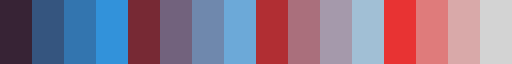

In [25]:
# All colors to create a complete legend
import matplotlib
colors = ["#372335", "#35557f", "#3375af", "#3292da", "#772934", "#72627d", "#6f88ad", "#6ca9d8", "#b12e33", "#aa6f7c", "#a599ab", "#a1bfd5", "#e83333", "#df7b7b", "#d9a9a9", "#d3d3d3"]
cmap = matplotlib.colors.ListedColormap(colors)
cmap

In [26]:
nbhr_clean = nbhr_clean.set_geometry('geometry')

In [ ]:
fig, ax = plt.subplots(figsize=(8,8))

# Step 1: Draw the map

nbhr_clean.plot(ax=ax, 
          column='combined_rank', # variable that is going to be used to color the map 
          cmap=cmap, # newly defined bivariate cmap 
          categorical=True, # bivariate choropleth has to be colored as categorical map 
          legend=False,
          alpha = .7) # we're going to draw the legend ourselves


ctx.add_basemap(ax=ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron)

plt.tight_layout() # "tighten" two figures map and basemap
plt.axis('off') # we don't need axis with coordinates
ax.set_title('Bivariate Choropleth')

# Step 2: draw the legend

# We're drawing a 3x3 "box" as 3 columns
# The xmin and xmax arguments axvspan are defined to create equally sized small boxes

img2 = fig # refer to the main figure
ax2 = fig.add_axes([0.15, 0.25, 0.1, 0.1]) # add new axes to place the legend there
                                         # and specify its location 
alpha = 1 # alpha argument to make it more/less transperent

# Column 1
ax2.axvspan(xmin=0, xmax=0.25, ymin=0, ymax=0.25, alpha=alpha, color=colors[15])
ax2.axvspan(xmin=0, xmax=0.25, ymin=0.25, ymax=0.50, alpha=alpha, color=colors[14])
ax2.axvspan(xmin=0, xmax=0.25, ymin=0.50, ymax=0.75, alpha=alpha, color=colors[13])
ax2.axvspan(xmin=0, xmax=0.25, ymin=0.75, ymax=1, alpha=alpha, color=colors[12])

# Column 2
ax2.axvspan(xmin=0.25, xmax=0.50, ymin=0, ymax=0.25, alpha=alpha, color=colors[11])
ax2.axvspan(xmin=0.25, xmax=0.50, ymin=0.25, ymax=0.50, alpha=alpha, color=colors[10])
ax2.axvspan(xmin=0.25, xmax=0.50, ymin=0.50, ymax=0.75, alpha=alpha, color=colors[9])
ax2.axvspan(xmin=0.25, xmax=0.50, ymin=0.75, ymax=1, alpha=alpha, color=colors[8])

# Column 3
ax2.axvspan(xmin=0.50, xmax=.75, ymin=0, ymax=0.25, alpha=alpha, color=colors[7])
ax2.axvspan(xmin=0.50, xmax=.75, ymin=0.25, ymax=0.50, alpha=alpha, color=colors[6])
ax2.axvspan(xmin=0.50, xmax=.75, ymin=0.50, ymax=0.75, alpha=alpha, color=colors[5])
ax2.axvspan(xmin=0.50, xmax=.75, ymin=0.75, ymax=1, alpha=alpha, color=colors[4])

# Column 4
ax2.axvspan(xmin=0.75, xmax=1, ymin=0, ymax=0.25, alpha=alpha, color=colors[3])
ax2.axvspan(xmin=0.75, xmax=1, ymin=0.25, ymax=0.50, alpha=alpha, color=colors[2])
ax2.axvspan(xmin=0.75, xmax=1, ymin=0.50, ymax=0.75, alpha=alpha, color=colors[1])
ax2.axvspan(xmin=0.75, xmax=1, ymin=0.75, ymax=1, alpha=alpha, color=colors[0])

# Step 3: annoate the legend
ax2.tick_params(axis='both', which='both', length=0) # remove ticks from the big box
ax2.axis('off'); # turn off its axis
ax2.text(s='%Δ Black Out', x=0.0, y=-0.15, fontsize = 8) # annotate x axis
ax2.text(s='%Δ White In', x=-0.15, y=0.0, fontsize = 8, rotation=90); # annotate y axis

In [31]:
nbhr_clean.crs = "EPSG:3857"

In [32]:
nbhr_clean['bins_black'] = pd.cut(nbhr_clean.delta_b_perc,4)
nbhr_clean['bins_white'] = pd.cut(nbhr_clean.delta_w_perc,4)
nbhr_clean.bins_black.value_counts()

(9.48, 182.627]       91
(182.627, 355.085]    10
(527.542, 700.0]       1
(355.085, 527.542]     0
Name: bins_black, dtype: int64

Remarks:
- We've created and sorted our dataset to reflect demographic shifts, particularly in white and black renter-occupied households. We defined some paramaters to try and slowly wittle down and isolate black neighbhorhoods that are showing demonstrating the ramifications of gentrification.
- We will need to explore and iterate on our approach to see if there are better methods to defining meaningful population shifts (i.e. historical data, renter-population by proportions rather than absolute values, etc.)
- We are missing some key neighborhoods as a result of unaligned census tract data - we will want to revisit this going forward to remedy this.
________________________________________________________________________________________________________________________________________________________________________________________________________________

In [25]:
# load in csv
df_permit = pd.read_csv('data/Building_Permits_clean')
# we don't need this column right now - we'll drop for the time being
df_permit = df_permit.drop(columns = '# of Residential Dwelling Units')
df_permit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1584195 entries, 0 to 1584194
Data columns (total 4 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   Census Tract        1582874 non-null  float64
 1   Permit Sub-Type     1584195 non-null  object 
 2   Issue Date          1584195 non-null  object 
 3   Latitude/Longitude  1499419 non-null  object 
dtypes: float64(1), object(3)
memory usage: 48.3+ MB


In [26]:
# check size of dataframe
df_permit.shape

(1584195, 4)

This is a very large file, we will need to subset in order to manage it size. Let's start by removing null values so we can trim it down.

In [27]:
# view # of missing values
print(df_permit['Latitude/Longitude'].isna().sum())
print(df_permit['Census Tract'].isna().sum())

84776
1321


In [28]:
# drop missing values and re-check to see if we successfully dropped
df_permit = df_permit[df_permit['Latitude/Longitude'].isna() != True]
df_permit = df_permit[df_permit['Census Tract'].isna() != True]
print(df_permit['Latitude/Longitude'].isna().sum())
print(df_permit['Census Tract'].isna().sum())

0
0


We're almost there but now we need to convert the date column to datetime so we can easily filter that dataframe by year. We will then convert these new dataframes to geodataframes so that we can join this data with the LA neighborhood boundaries.

In [29]:
# convert column to datetime, then subset dataframe into two separate based on year the permit was issued (2021 vs 2017)
df_permit['Issue Date'] = pd.to_datetime(df_permit['Issue Date'])
df_permit = df_permit[(df_permit['Issue Date'] > '2017-01-01') & (df_permit['Issue Date'] < '2022-01-01')]
df_permit.shape

(775166, 4)

In [30]:
# we need to parse out the lat/long values into a format that geopandas can join on, we'll split the column 'Latitude/Longitude' into 'lat' and 'long' and convert to numeric
# split column, then adding new columns with split results
df_permit[['lat', 'long']] = df_permit['Latitude/Longitude'].str.split(', ', expand=True)
# remove unnessary characters
df_permit["lat"]=df_permit["lat"].str.replace('(','')
df_permit["long"]=df_permit["long"].str.replace(')','')
# convert string to numeric
df_permit['lat'] = pd.to_numeric(df_permit['lat'])
df_permit['long'] = pd.to_numeric(df_permit['long'])
# drop unused column
df_permit = df_permit.drop(columns = ['Latitude/Longitude'])
df_permit.head()

,Census Tract,Permit Sub-Type,Issue Date,lat,long
0,2364.00,1 or 2 Family Dwelling,2021-10-06,34.00870,-118.35113
1,1920.02,Apartment,2021-10-01,34.08411,-118.35721
2,1347.20,Commercial,2021-10-08,34.20129,-118.56321
3,1439.01,Commercial,2021-02-12,34.14508,-118.41248
4,1872.00,1 or 2 Family Dwelling,2021-06-16,34.10709,-118.25077


In [31]:
df_permit_2021 = df_permit[(df_permit['Issue Date'] > '2021-01-01') & (df_permit['Issue Date'] < '2022-01-01')]
df_permit_2017 = df_permit[(df_permit['Issue Date'] > '2017-01-01') & (df_permit['Issue Date'] < '2018-01-01')]

In [32]:
# convert dataframes into geodataframes
gdf_permit_2021 = gpd.GeoDataFrame(df_permit_2021,
                         crs='epsg:4326',
                       geometry=gpd.points_from_xy(df_permit_2021['long'], df_permit_2021['lat']))

gdf_permit_2017 = gpd.GeoDataFrame(df_permit_2017,
                         crs='epsg:4326',
                       geometry=gpd.points_from_xy(df_permit_2017['long'], df_permit_2017['lat']))

Considering that one site can have a multitude of permits issued, we will drop duplicates based on lat/long so that we are not counting the same development more than once. Once we've done so, we can then spatially join with the neighborhood boundaries.

In [33]:
# drop duplicates from both dataframes and evaluate how many rows were dropped as a result
print('# of 2021 sites before dropping duplicates:', gdf_permit_2021.shape[0])
gdf_permit_2021 = gdf_permit_2021.drop_duplicates(subset='geometry')
print('# of 2021 sites after dropping duplicates:', gdf_permit_2021.shape[0])

print('# of 2017 sites before dropping duplicates:', gdf_permit_2017.shape[0])
gdf_permit_2017 = gdf_permit_2017.drop_duplicates(subset='geometry')
print('# of 2017 sites after dropping duplicates:', gdf_permit_2017.shape[0])

# of 2021 sites before dropping duplicates: 148470
# of 2021 sites after dropping duplicates: 72814
# of 2017 sites before dropping duplicates: 160697
# of 2017 sites after dropping duplicates: 73266


Quick pause before we spatially join with neighborhood data - let's see what this look like as raw point data.

In [ ]:
# cleared output to reduce size
# plot using plotly.express with color indicating permit type
fig = px.scatter_mapbox(gdf_permit_2021,
                        lat=gdf_permit_2021.geometry.y,
                        lon=gdf_permit_2021.geometry.x,
                        mapbox_style="carto-positron",
                        color = 'Permit Sub-Type',
                        opacity = .6,
                        zoom=9.15, 
                        center = {"lat": 34.02, "lon": -118.38411},)

# options on the layout
fig.update_layout(
    width = 1000,
    height = 800,
    title = "Interactive Map of Permit Issuances for 2021 by Permit Type",
    title_x=0.5 # aligns title to center
) 

fig.show()

In [34]:
# spatial join on dataframes created above and neighborhood geodataframe
neighborhoods_permits_2021 = gpd.sjoin(nbh, gdf_permit_2021)
neighborhoods_permits_2017 = gpd.sjoin(nbh, gdf_permit_2017)

In [35]:
# drop unused columns
neighborhoods_permits_2021 = neighborhoods_permits_2021.drop(columns = ['index_right', 'Issue Date','lat','long','Census Tract'])
neighborhoods_permits_2017 = neighborhoods_permits_2017.drop(columns = ['index_right', 'Issue Date','lat','long','Census Tract'])

In [36]:
# inspect dataframe
neighborhoods_permits_2021

,OBJECTID,name,geometry,Permit Sub-Type
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1 or 2 Family Dwelling
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1 or 2 Family Dwelling
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",Apartment
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",Apartment
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1 or 2 Family Dwelling
...,...,...,...,...
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1 or 2 Family Dwelling
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1 or 2 Family Dwelling
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1 or 2 Family Dwelling
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1 or 2 Family Dwelling


Let's take a quick look at the values for each neighborhood by permit type as this represents how we want to structure and organize our dataframes.

In [37]:
# view breakdown by name, by permit type and their counts
neighborhoods_permits_2021.groupby(['name','Permit Sub-Type']).size()

name             Permit Sub-Type       
Adams-Normandie  1 or 2 Family Dwelling    121
                 Apartment                  56
                 Commercial                 17
                 Special Equipment           1
Arleta           1 or 2 Family Dwelling    566
                                          ... 
Woodland Hills   Apartment                 124
                 Commercial                143
                 Onsite                     22
                 Public Safety Only          2
                 Special Equipment           4
Length: 578, dtype: int64

In [38]:
# view breakdown by name, by permit type and their counts
neighborhoods_permits_2017.groupby(['name','Permit Sub-Type']).size()

name             Permit Sub-Type       
Adams-Normandie  1 or 2 Family Dwelling    101
                 Apartment                  54
                 Commercial                 26
                 Offsite                     1
                 Onsite                      1
                                          ... 
Woodland Hills   Apartment                 108
                 Commercial                209
                 Onsite                     34
                 Public Safety Only          2
                 Special Equipment           2
Length: 537, dtype: int64

We now have two dataframes with each row indicating a development, by neighborhood, by type. We now want to reduce the number of rows to the number of neighborhoods in LA City, with a count representing the total number of permits for each category represented by a column. We will do this by getting dummies for each permit type, summing their values for each neighborhood and then dropping duplicates.

In [39]:
# make dataframes wider by getting dummies for permit type
neighborhoods_permits_2021 = pd.get_dummies(neighborhoods_permits_2021, columns=['Permit Sub-Type'])
neighborhoods_permits_2017 = pd.get_dummies(neighborhoods_permits_2017, columns=['Permit Sub-Type'])
# the last four permit types are a small fraction of the total permit counts, to simplify our analysis, we will drop these columns.
neighborhoods_permits_2021 = neighborhoods_permits_2021.drop(columns = ['Permit Sub-Type_Offsite', 'Permit Sub-Type_Onsite', 'Permit Sub-Type_Public Safety Only', 'Permit Sub-Type_Special Equipment'])
neighborhoods_permits_2017 = neighborhoods_permits_2017.drop(columns = ['Permit Sub-Type_Offsite', 'Permit Sub-Type_Onsite', 'Permit Sub-Type_Public Safety Only', 'Permit Sub-Type_Special Equipment'])
# rename columns
neighborhoods_permits_2021 = neighborhoods_permits_2021.rename(columns={"Permit Sub-Type_1 or 2 Family Dwelling": "sfh","Permit Sub-Type_Apartment":"apt","Permit Sub-Type_Commercial":"com"})
neighborhoods_permits_2017 = neighborhoods_permits_2017.rename(columns={"Permit Sub-Type_1 or 2 Family Dwelling": "sfh","Permit Sub-Type_Apartment":"apt","Permit Sub-Type_Commercial":"com"})

In [40]:
# check dataframe to confirm
neighborhoods_permits_2021

,OBJECTID,name,geometry,sfh,apt,com
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1,0,0
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1,0,0
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",0,1,0
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",0,1,0
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1,0,0
...,...,...,...,...,...,...
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1,0,0
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1,0,0
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1,0,0
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1,0,0


In [41]:
# sum total count of permits by neighborhood and then drop duplicates
# 2021 dataframe
neighborhoods_permits_2021['sfh'] = neighborhoods_permits_2021.groupby("name", sort=False)["sfh"].transform('sum')
neighborhoods_permits_2021['apt'] = neighborhoods_permits_2021.groupby("name", sort=False)["apt"].transform('sum')
neighborhoods_permits_2021['com'] = neighborhoods_permits_2021.groupby("name", sort=False)["com"].transform('sum')
neighborhoods_permits_2021 = neighborhoods_permits_2021.drop_duplicates()

# 2017 dataframe
neighborhoods_permits_2017['sfh'] = neighborhoods_permits_2017.groupby("name", sort=False)["sfh"].transform('sum')
neighborhoods_permits_2017['apt'] = neighborhoods_permits_2017.groupby("name", sort=False)["apt"].transform('sum')
neighborhoods_permits_2017['com'] = neighborhoods_permits_2017.groupby("name", sort=False)["com"].transform('sum')
neighborhoods_permits_2017 = neighborhoods_permits_2017.drop_duplicates()

In [42]:
neighborhoods_permits_2021

,OBJECTID,name,geometry,sfh,apt,com
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",121,56,17
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",566,5,23
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",132,72,31
3,4,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",293,32,47
4,5,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",398,203,31
...,...,...,...,...,...,...
109,110,Wilmington,"MULTIPOLYGON (((-118.28331 33.75532, -118.2880...",292,32,115
110,111,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",153,14,13
111,112,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",996,57,49
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",2025,124,143


In [43]:
# create total permit column for each year
# 2021 dataframe
neighborhoods_permits_2021['total'] = neighborhoods_permits_2021['sfh'] + neighborhoods_permits_2021['apt'] + neighborhoods_permits_2021['com']
# 2017 dataframe
neighborhoods_permits_2017['total'] = neighborhoods_permits_2017['sfh'] + neighborhoods_permits_2017['apt'] + neighborhoods_permits_2017['com']

We now have two dataframes with permit counts for two separate years that coincide with the LA neighborhoods that we want to analyze. With this completed, we will merge the dataframes and generate a new column with the % change in permit count to derive a proxy value that roughly indicates the growth in development across LA cities. 

In [44]:
# merge dataframes so that we have one dataframe containing one row for each neighborhood and permit issuance counts for each year and permit type
neighborhoods_permits_combined = neighborhoods_permits_2021.merge(neighborhoods_permits_2017,suffixes=('_2021', '_2017'),on="name")
# subset dataframe to only contain useful columns
neighborhoods_permits_combined = neighborhoods_permits_combined[['name','geometry_2021','sfh_2021','apt_2021','com_2021','total_2021','sfh_2017','apt_2017','com_2017','total_2017']]
# rename geometry column
neighborhoods_permits_combined = neighborhoods_permits_combined.rename(columns={'geometry_2021':'geometry'})
# generate new column to account for permit change over time
neighborhoods_permits_combined['Permit Number Percent Change'] = (neighborhoods_permits_combined.total_2021/neighborhoods_permits_combined.total_2017)*100
# sort by name
neighborhoods_permits_combined = neighborhoods_permits_combined.sort_values('name')
# view dataframe
neighborhoods_permits_combined

,name,geometry,sfh_2021,apt_2021,com_2021,total_2021,sfh_2017,apt_2017,com_2017,total_2017,Permit Number Percent Change
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",121,56,17,194,101,54,26,181,107.182320
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",566,5,23,594,602,8,20,630,94.285714
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",132,72,31,235,154,99,45,298,78.859060
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",293,32,47,372,284,14,75,373,99.731903
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",398,203,31,632,324,190,58,572,110.489510
...,...,...,...,...,...,...,...,...,...,...,...
108,Westwood,"POLYGON ((-118.42946 34.07925, -118.42938 34.0...",354,236,90,680,402,245,102,749,90.787717
109,Wilmington,"MULTIPOLYGON (((-118.28331 33.75532, -118.2880...",292,32,115,439,299,30,214,543,80.847145
110,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",153,14,13,180,159,9,18,186,96.774194
111,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",996,57,49,1102,795,42,82,919,119.912949


To build off our previous exercise of evaluating demographic shifts, we will bring in the value that we created which assessed the % difference in white immigration vs black emigration. We will use this value to sort our analysis as we've already begun to define potential neighborhoods that may likely to experience the ill-effects of gentrification. We will do this by first adding this column onto our permit dataframe, followed by subsetting the dataframe with the neighborhoods that we had isolated previously.

In [45]:
# add demographic shift values in order to sort our visualization
neighborhoods_permits_combined['Percent Differential'] = nbhr_2021['Percent Differential'].values
# reset index so we can subset our permit dataframe on the final demographic shift dataframe created in the previous exercise
neighborhoods_permits_combined = neighborhoods_permits_combined.reset_index(drop=True)
neighborhoods_permits_combined

,name,geometry,sfh_2021,apt_2021,com_2021,total_2021,sfh_2017,apt_2017,com_2017,total_2017,Permit Number Percent Change,Percent Differential
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",121,56,17,194,101,54,26,181,107.182320,88.945959
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",566,5,23,594,602,8,20,630,94.285714,75.564682
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",132,72,31,235,154,99,45,298,78.859060,-21.147929
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",293,32,47,372,284,14,75,373,99.731903,55.555556
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",398,203,31,632,324,190,58,572,110.489510,-16.397823
...,...,...,...,...,...,...,...,...,...,...,...,...
109,Westwood,"POLYGON ((-118.42946 34.07925, -118.42938 34.0...",354,236,90,680,402,245,102,749,90.787717,-8.872336
110,Wilmington,"MULTIPOLYGON (((-118.28331 33.75532, -118.2880...",292,32,115,439,299,30,214,543,80.847145,-10.847505
111,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",153,14,13,180,159,9,18,186,96.774194,41.186207
112,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",996,57,49,1102,795,42,82,919,119.912949,4.336177


In [46]:
# subset dataframe our permit dataframe on the dataframe created in the previous exercise
neighborhoods_permits_combined_black = neighborhoods_permits_combined[neighborhoods_permits_combined.index.isin(nbhr_trim_black.index)]
# sort by demographic shift value
neighborhoods_permits_combined_black = neighborhoods_permits_combined_black.sort_values('Percent Differential', ascending = False)
neighborhoods_permits_combined_black.head(5)

,name,geometry,sfh_2021,apt_2021,com_2021,total_2021,sfh_2017,apt_2017,com_2017,total_2017,Permit Number Percent Change,Percent Differential
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",121,56,17,194,101,54,26,181,107.182320,88.945959
51,Jefferson Park,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",270,76,36,382,303,46,34,383,99.738903,71.721088
31,Exposition Park,"POLYGON ((-118.29155 34.01837, -118.28294 34.0...",306,60,32,398,301,63,45,409,97.310513,49.631358
107,Westchester,"POLYGON ((-118.35862 33.98240, -118.35856 33.9...",1025,126,205,1356,823,112,224,1159,116.997412,42.040646
11,Broadway-Manchester,"POLYGON ((-118.26954 33.92919, -118.26956 33.9...",206,23,25,254,244,24,44,312,81.410256,36.055708


In [ ]:
# let's plot our findings from above via a bar graph with neighborhoods on the x-axis, with the left bar indicating 2017 building permit numbers and the right bar indicating 2021 building permit numbers
fig = go.Figure()

fig.add_trace(go.Bar(x=neighborhoods_permits_combined_black['name'],
                y=neighborhoods_permits_combined_black['total_2017'],
                name='2017 Permit Count',
                marker_color='rgb(158,73,99)',
                     opacity = .8
                ))
fig.add_trace(go.Bar(x=neighborhoods_permits_combined_black['name'],
                y=neighborhoods_permits_combined_black['total_2021'],
                name='2021 Permit Count',
                marker_color='rgb(216,139,118)',
                     opacity = .8
                ))

fig.update_layout(
    title='Build Permit Issued: 2017 vs 2021, neighborhoods ordered in descending order by black vs white shift differential percentages.',
    title_y = .9,
    xaxis_tickfont_size=12,
    yaxis=dict(
        title='Number of Building Permits Issued',
        titlefont_size=14,
        tickfont_size=12,
    ),
    legend=dict(
        x=1,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 ,# gap between bars of the same location coordinate.
    
    width=1500,
    height=750
)
fig.show()


Now that we have visualized the absolute values of permit issuances for the two years, let's take a look at how these values have changed overtime via a choropleth map with the color indicating the percent change between the two years.

In [47]:
# geodataframe got converted back to normal dataframe during merging process, re-doing this step to create map plot
neighborhoods_permits_combined = gpd.GeoDataFrame(neighborhoods_permits_combined,
                         crs='epsg:4326',
                       geometry=neighborhoods_permits_combined.geometry)
neighborhoods_permits_combined.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   name                          114 non-null    object  
 1   geometry                      114 non-null    geometry
 2   sfh_2021                      114 non-null    uint64  
 3   apt_2021                      114 non-null    uint64  
 4   com_2021                      114 non-null    uint64  
 5   total_2021                    114 non-null    uint64  
 6   sfh_2017                      114 non-null    uint64  
 7   apt_2017                      114 non-null    uint64  
 8   com_2017                      114 non-null    uint64  
 9   total_2017                    114 non-null    uint64  
 10  Permit Number Percent Change  114 non-null    float64 
 11  Percent Differential          106 non-null    float64 
dtypes: float64(2), geometry(1), object(1), uin

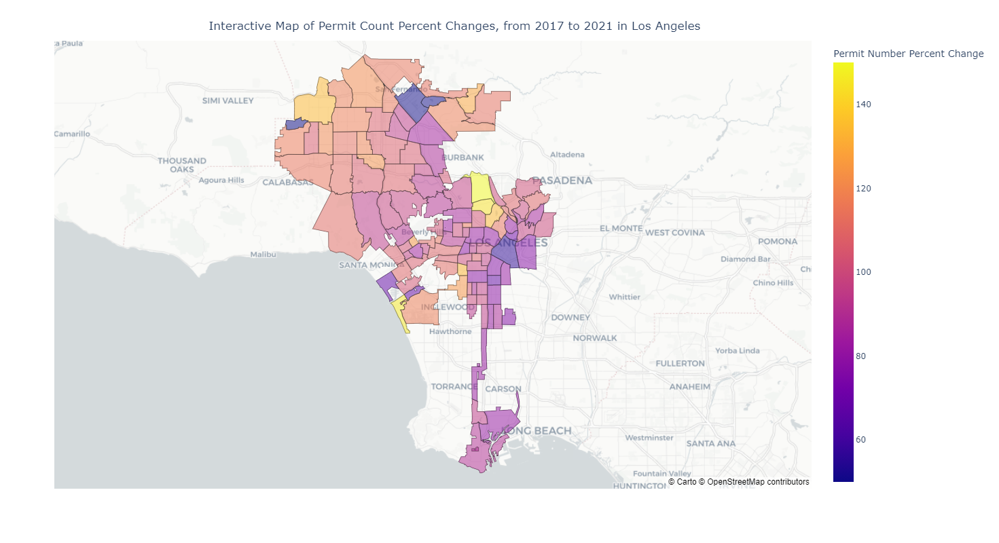

In [48]:
# create chloropleth map that evaluates the differential seen between the two bars above (expanded for whole dataset rather than just black neighborhoods)
chor_map(data = neighborhoods_permits_combined, title="Interactive Map of Permit Count Percent Changes, from 2017 to 2021 in Los Angeles", color = 'Permit Number Percent Change', range_color=(50, 150))

Remarks:
- We've successfully developed a better understanding of development patterns by neighborhood from the 2017 to 2021, with a particular focus on the black neighborhoods we isolated in the previous step.
- Some interesting findings is that of the top neighborhoods with the largest demographic shift, the overall building permit issuance counts are relatively low (e.g. Adams-Normandie, Jefferson Park, Exposition Park, etc.). This may be caused by the fact that these neighborhoods are relatively small and any percent changes in demographic shifts would be weighted heavily. This is not necessarily incorrect or a negative outcome but something to keep in mind going forward. We will want to make sure the manner in which we classify neighborhoods is resilient to being misproportionately weighted.
- It would be interesting to visualize the differences in permit types and see if anything can be gleaned from that type of development that is occuring in these areas. This difference would be nuanced but could be important in our analysis going forward.
________________________________________________________________________________________________________________________________________________________________________________________________________________

The final variable we will assess is the change in rent price values from 2017 to 2021 (5 year averages). We will essentially mirror the process conducted in the previous exercise by merging census tract level data with our neighborhood boundaries. This will help us develop a better understanding of if and to what degree minority neighborhoods are in the process of or at risk of being priced out of their community. 

In [49]:
# bring in 2017 rent data
df_rent_2017 = pd.read_csv('data/rent_2017.csv', dtype = {'FIPS':str})
# bring in 2021 rent data
df_rent_2021 = pd.read_csv('data/rent_2021.csv', dtype = {'FIPS':str})

# add leading zeroes
df_rent_2017['FIPS'] = df_rent_2017['FIPS'].str.zfill(11)
df_rent_2021['FIPS'] = df_rent_2017['FIPS'].str.zfill(11)

Merging, checking for null values, dropping if need be, and taking a glimpse at the data.

In [50]:
# merge data 
df_rent=df_rent_2021.merge(df_rent_2017,on="FIPS")
# check for na values
df_rent.isna().sum()

FIPS          0
rent_2021    26
rent_2017    48
dtype: int64

In [51]:
# drop na values and re-check
df_rent = df_rent.dropna()
df_rent.isna().sum()

FIPS         0
rent_2021    0
rent_2017    0
dtype: int64

In [52]:
# assess rent statistics
df_rent.describe()

,rent_2021,rent_2017
count,2273.000000,2273.000000
mean,1793.182578,1478.293005
std,569.445769,498.306007
min,263.000000,306.000000
25%,1392.000000,1138.000000
50%,1664.000000,1334.000000
75%,2052.000000,1695.000000
max,3501.000000,3501.000000


We have our rent dataframe correctly organized by census tract but we will want to merge it with our dataframe that contains spatial information so that we can ultimately locate the census tracts within our neighborhoods.

In [53]:
# merge dataframes together
spatial_rent=tracts.merge(df_rent, on='FIPS')
# check if successful
spatial_rent

,CT20,geometry,FIPS,rent_2021,rent_2017
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,1689.0,1566.0
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,2529.0,2170.0
2,101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,1484.0,1148.0
3,101300,"POLYGON ((-118.26530 34.25735, -118.26530 34.2...",06037101300,1525.0,2353.0
4,101400,"POLYGON ((-118.29657 34.25356, -118.29694 34.2...",06037101400,2393.0,1225.0
...,...,...,...,...,...
1958,980008,"POLYGON ((-118.49909 34.22160, -118.49903 34.2...",06037980008,1319.0,1156.0
1959,980015,"POLYGON ((-118.28104 33.78180, -118.28105 33.7...",06037980015,790.0,950.0
1960,980019,"POLYGON ((-118.53452 34.13038, -118.53451 34.1...",06037980019,1967.0,3250.0
1961,980024,"POLYGON ((-118.47042 34.18044, -118.47293 34.1...",06037980024,1773.0,2269.0


Prepare our new dataframe which contains geospatial census tract information by creating a centroid for the census boundaries. Then run a spatial join and check if successful.

In [54]:
# prepare demographic data for spatial join with neighborhoods
# first adjust census data to point data 
spatial_rent = spatial_rent.to_crs(4326)
spatial_rent['Centroid']=spatial_rent.to_crs('+proj=cea').centroid.to_crs(spatial_rent.crs)
spatial_rent_1 = spatial_rent.to_crs(4326)
spatial_rent_1 = spatial_rent.drop(columns=['CT20','geometry'])
spatial_rent_1.rename(columns={'Centroid': 'geometry'}, inplace=True)
spatial_rent_1

,FIPS,rent_2021,rent_2017,geometry
0,06037101110,1689.0,1566.0,POINT (-118.29300 34.25948)
1,06037101122,2529.0,2170.0,POINT (-118.29016 34.26773)
2,06037101220,1484.0,1148.0,POINT (-118.28164 34.25161)
3,06037101300,1525.0,2353.0,POINT (-118.27101 34.24878)
4,06037101400,2393.0,1225.0,POINT (-118.29417 34.24286)
...,...,...,...,...
1958,06037980008,1319.0,1156.0,POINT (-118.49069 34.21064)
1959,06037980015,790.0,950.0,POINT (-118.29320 33.77653)
1960,06037980019,1967.0,3250.0,POINT (-118.54819 34.09130)
1961,06037980024,1773.0,2269.0,POINT (-118.48863 34.17668)


In [55]:
# spatial join
nbh_rent = nbh.sjoin(spatial_rent_1, how="left")
nbh_rent = nbh_rent.drop(columns = ['OBJECTID','index_right','FIPS'])
nbh_rent

,name,geometry,rent_2021,rent_2017
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1307.0,937.0
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",2589.0,1250.0
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1303.0,1130.0
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",2284.0,961.0
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1397.0,946.0
...,...,...,...,...
113,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1784.0,1922.0
113,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1682.0,1279.0
113,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1430.0,2219.0
113,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1463.0,1555.0


We now have located our census tract level data into our neighborhood boundaries but we have lost a considerable amount of information along the way. In order to reduce our geodataframe to neighborhood level, we will need to average rent values for both years by neighborhood name. We will then trim down our dataframe to capture just neighborhood-level data. Finally we will generate a new column that is the difference between the two averages. 

In [56]:
# average rent values for each year by neighborhood and generate columns with new values
nbh_rent['rent_21_mean'] = nbh_rent.groupby("name", sort=False)["rent_2021"].transform('mean')
nbh_rent['rent_17_mean'] = nbh_rent.groupby("name", sort=False)["rent_2017"].transform('mean')
# drop unused columns
nbh_rent = nbh_rent.drop(columns = ['rent_2021','rent_2017'])
# drop duplicate rows
nbh_rent = nbh_rent.drop_duplicates()
# add column which calculates the % change from the two timeframes for each census tract
nbh_rent['Rent Price Percent Change'] = (nbh_rent.rent_21_mean/nbh_rent.rent_17_mean)*100
nbh_rent = nbh_rent.sort_values('name').reset_index()
# check if successful
nbh_rent

,index,name,geometry,rent_21_mean,rent_17_mean,Rent Price Percent Change
0,0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1776.000000,1044.800000,169.984686
1,1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",1430.333333,1876.666667,76.216696
2,2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",1417.400000,1101.400000,128.690757
3,3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",1892.000000,1488.000000,127.150538
4,4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",1270.600000,1145.600000,110.911313
...,...,...,...,...,...,...
109,108,Westwood,"POLYGON ((-118.42946 34.07925, -118.42938 34.0...",1227.428571,2163.571429,56.731595
110,109,Wilmington,"MULTIPOLYGON (((-118.28331 33.75532, -118.2880...",2192.333333,1068.200000,205.236223
111,110,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",1428.000000,1412.000000,101.133144
112,111,Winnetka,"POLYGON ((-118.56232 34.23199, -118.56232 34.2...",2007.714286,1213.428571,165.457970


Lastly we will add the Percent Differential used in the first exercise to help sort our visualizations (as we did previously) and then we will subset our data based on the neighborhoods we originally isolated.

In [57]:
# add Percent Differential from first exercise 
nbh_rent['Percent Differential'] = nbhr_2021['Percent Differential'].values
# subset dataframe our permit dataframe on the dataframe created in the first exercise
nbh_rent_black = nbh_rent[nbh_rent.index.isin(nbhr_trim_black.index)]
# sort by demographic shift value
nbh_rent_black = nbh_rent_black.sort_values('Percent Differential', ascending = False)
nbh_rent_black

,index,name,geometry,rent_21_mean,rent_17_mean,Rent Price Percent Change,Percent Differential
0,0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1776.000000,1044.800000,169.984686,88.945959
51,51,Jefferson Park,"POLYGON ((-118.31335 34.03721, -118.30900 34.0...",1521.714286,1065.142857,142.864807,71.721088
31,31,Exposition Park,"POLYGON ((-118.29155 34.01837, -118.28294 34.0...",1986.333333,1086.833333,182.763380,49.631358
107,104,Westchester,"POLYGON ((-118.35862 33.98240, -118.35856 33.9...",2760.375000,1843.875000,149.705105,42.040646
11,11,Broadway-Manchester,"POLYGON ((-118.26954 33.92919, -118.26956 33.9...",1308.400000,1167.800000,112.039733,36.055708
100,100,Vermont Square,"POLYGON ((-118.28112 34.01109, -118.28121 34.0...",1299.285714,1077.142857,120.623342,35.309090
101,101,Vermont Vista,"POLYGON ((-118.28044 33.92912, -118.28066 33.9...",1318.800000,1043.000000,126.442953,27.706265
86,85,South Park,"POLYGON ((-118.28040 33.98916, -118.28061 33.9...",1532.571429,1068.857143,143.384122,26.496747
37,37,Green Meadows,"POLYGON ((-118.25411 33.95104, -118.25411 33.9...",1280.571429,1148.857143,111.464810,22.082758
60,59,Mar Vista,"POLYGON ((-118.42142 34.01033, -118.42010 34.0...",1326.500000,1746.200000,75.964952,19.613873


We are now ready to plot our create dataframe/geodataframe above.

In [ ]:
# let's plot our findings from above via a bar graph with neighborhoods on the x-axis,
# with the left bar indicating 2017 average rent prices and the right bar indicating 2021 average rent pricees
fig = go.Figure()

fig.add_trace(go.Bar(x=nbh_rent_black['name'],
                y=nbh_rent_black['rent_17_mean'],
                name='2017 Average Rent Price',
                marker_color='rgb(158,73,99)',
                     opacity = .8
                ))
fig.add_trace(go.Bar(x=nbh_rent_black['name'],
                y=nbh_rent_black['rent_21_mean'],
                name='2021 Average Rent Price',
                marker_color='rgb(216,139,118)',
                     opacity = .8
                ))

fig.update_layout(
    title='Average Rent Prices: 2017 vs 2021, neighborhoods ordered in descending order by black vs white shift differential percentages.',
    title_y = .9,
    xaxis_tickfont_size=12,
    yaxis=dict(
        title='Average Rent Prices, in dollars',
        titlefont_size=14,
        tickfont_size=12,
    ),
    legend=dict(
        x=1,
        y=1.0,
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 ,# gap between bars of the same location coordinate.
    
    width=1500,
    height=750
)
fig.show()

In [ ]:
# create chloropleth map that evaluates the differential seen between the two bars above (expanded for whole dataset rather than just black neighborhoods)
chor_map(data = nbh_rent, color = 'Rent Price Percent Change', title = 'Interactive Map of Rent Price Percent Changes, from 2017 to 2021 in Los Angeles', range_color = (0,200))

Remarks:
- We've successfully developed a better understanding of rent price shifts by neighborhood from the 2017 to 2021, with a particular focus on the black neighborhoods we isolated in the previous step.
- Some interesting findings is that of the top neighborhoods (that we previously sorted) do reflect a large percentage change in rent values, further indicating that these areas are undergoing/susceptible to gentrification. 
- Average rent prices from census level data is not a perfect measure for understanding how a renter might be priced out of their communities. Taking into account how new developments are pricing their units (or a similar metric) would provide a better understanding of gentrifying forces. For the time being, average rent price suffices.
________________________________________________________________________________________________________________________________________________________________________________________________________________


*Nothing changed about this section, outputs cleared to reduce file size*

To build off some previous assignments and to provide a foundation as to why rent price matters, particularly as it relates to the disproportionate effect on minority communities, rent burden across ethnicity groups is analyzed below. We will pull census data that captures the percentage of renter-households in a census-tract that pay more than 30% of their income toward rent (30% is the HUD defined threshold). We will categorize this by race and demonstrate the effects on non-white communities.

Pull in census data and add leading zeroes.

In [ ]:
# import rent burden csv file
df_rent_burden = pd.read_csv('data/rent_burden_ct_1.csv', dtype = {'Geo_FIPS':str})
# fips column does not have a leading zero, let's add that here
df_rent_burden['Geo_FIPS'] = df_rent_burden['Geo_FIPS'].str.zfill(11)
# inspect rent burden data frame
df_rent_burden.head()

In order to determine the majority race of the population, we will create a function that evaluates the renter population by race against one another and then returns the race that is predominant. We will add a column which captures this return with each census tract categorized by race.

In [ ]:
def categorise_race_tracts(row):  
    if row['black_alone'] > row['white_alone'] and row['black_alone'] > row['hispanic'] and row['black_alone'] > row['other'] and row['black_alone'] > row['asian_alone']:
        return 'Black'
    elif row['hispanic'] > row['white_alone'] and row['hispanic'] > row['black_alone'] and row['hispanic'] > row['other'] and row['hispanic'] > row['asian_alone']:
        return 'Hispanic'
    elif row['white_alone'] > row['hispanic'] and row['white_alone'] > row['black_alone'] and row['white_alone'] > row['other'] and row['white_alone'] > row['asian_alone']:
        return 'White'
    elif row['asian_alone'] > row['hispanic'] and row['asian_alone'] > row['black_alone'] and row['asian_alone'] > row['other'] and row['black_alone'] > row['white_alone']:
        return 'Asian'
    return 'Other'

# iterate on dataframe and create new column by applying created race function
df_rent_burden['majority_race'] = df_rent_burden.apply(lambda row: categorise_race_tracts(row), axis=1)
# assess results
df_rent_burden.value_counts('majority_race')

In [ ]:
#check dataframe
df_rent_burden

We now have a dataframe that roughly captures race across census districts. Let's separate by the major race categories in Los Angeles County and evaluate the degree to which they suffer from rent burden. 

In [ ]:
# separate dataframes by race
df_rent_burden_white = df_rent_burden[df_rent_burden.majority_race == 'White']
df_rent_burden_black = df_rent_burden[df_rent_burden.majority_race == 'Black']
df_rent_burden_hispanic = df_rent_burden[df_rent_burden.majority_race == 'Hispanic']

In [ ]:
#lets take a look at the correlation between the race of renter-occupied households and the percentages of rent burden for the census tract

# set subplots
fig, axes = plt.subplots(2, 3, figsize = (20, 12))

# set visual style
sns.set(style="darkgrid")

# create histogram plots
histplot_white = sns.histplot(ax = axes[0,0], data=df_rent_burden_white, x='rent_burden', alpha = .5, bins =30, color = [158/255,73/255,99/255], kde = True)
histplot_black = sns.histplot(ax = axes[0,1], data=df_rent_burden_black, x='rent_burden', alpha = .5, bins =30, color = [216/255,139/255,118/255],kde = True)
histplot_hispanic = sns.histplot(ax = axes[0,2], data=df_rent_burden_hispanic, x='rent_burden', alpha = .5, bins =30, color = [80/255,45/255,93/255], kde = True)

# create regression plots
scatter_white = sns.regplot(ax = axes[1,0], data=df_rent_burden, x= 'rent_burden', y= 'white_alone', scatter_kws={"color": [158/255,73/255,99/255], "s": 4, "alpha" : .3 }, line_kws={'linewidth':1,'alpha':.6, "color": [158/255,73/255,99/255]})
scatter_black = sns.regplot(ax = axes[1,1], data=df_rent_burden, x= 'rent_burden', y= 'black_alone', scatter_kws={"color": [216/255,139/255,118/255], "s": 4, "alpha" : .3}, line_kws={'linewidth':1,'alpha':1, "color": [222/255,170/255,137/255]})
scatter_hispanic = sns.regplot(ax = axes[1,2], data=df_rent_burden, x= 'rent_burden', y= 'hispanic', scatter_kws={"color": [80/255,45/255,93/255], "s": 4, "alpha" : .3}, line_kws={'linewidth':1,'alpha':1, "color": [80/255,45/255,93/255]})

# change x-axis and y-axis labels
axes[1,0].set_xlabel('Rent Burden by White-Renter Households', fontsize = 14)
axes[1,1].set_xlabel('Rent Burden by Black-Renter Households', fontsize = 14)
axes[1,2].set_xlabel('Rent Burden by Hispanic-Renter Households', fontsize = 14)

axes[1,0].set_ylabel('Count')
axes[1,1].set_ylabel(' ')
axes[1,2].set_ylabel(' ')

axes[0,0].set(xlabel=' ', ylabel = 'Density')
axes[0,1].set(xlabel=' ', ylabel = ' ')
axes[0,2].set(xlabel=' ', ylabel = ' ')

#align x-axis and y-axis grid lines for histogram plots
histplot_white.xaxis.set_major_locator(LinearLocator(6))
histplot_black.xaxis.set_major_locator(LinearLocator(6)) 
histplot_hispanic.xaxis.set_major_locator(LinearLocator(6)) 
histplot_white.yaxis.set_major_locator(LinearLocator(6))
histplot_black.yaxis.set_major_locator(LinearLocator(6)) 
histplot_hispanic.yaxis.set_major_locator(LinearLocator(6))

#align x-axis and y-axis grid lines for scatter plots
scatter_white.xaxis.set_major_locator(LinearLocator(6))
scatter_black.xaxis.set_major_locator(LinearLocator(6)) 
scatter_hispanic.xaxis.set_major_locator(LinearLocator(6)) 
scatter_white.yaxis.set_major_locator(LinearLocator(6))
scatter_black.yaxis.set_major_locator(LinearLocator(6)) 
scatter_hispanic.yaxis.set_major_locator(LinearLocator(6))

# change x-axis and y-axis tick labels for histogram plots
histplot_white.set_xticklabels(labels = [' ', '20%', '40% ', '60% ', '80%', '100%'], fontsize = 10, y=.02)
histplot_black.set_xticklabels(labels = [' ', '20%', '40% ', '60% ', '80%', '100%'], fontsize = 10, y=.02)
histplot_hispanic.set_xticklabels(labels = [' ', '20%', '40% ', '60% ', '80%', '100%'], fontsize = 10, y=.02)
scatter_white.set_xticklabels(labels = [' ', '20%', '40% ', '60% ', '80%', '100%'], fontsize = 10, y=.02)
scatter_black.set_xticklabels(labels = [' ', '20%', '40% ', '60% ', '80%', '100%'], fontsize = 10, y=.02)
scatter_hispanic.set_xticklabels(labels = [' ', '20%', '40% ', '60% ', '80%', '100%'], fontsize = 10, y=.02)

histplot_white.set_yticklabels(labels = [' ', '20', '40', '60', '80', '100'], fontsize = 10, y=.02)
histplot_black.set_yticklabels(labels = [' ', '3', '6', '9', '12', '15'], fontsize = 10, y=.02)
histplot_hispanic.set_yticklabels(labels = [' ', '20', '40', '60', '80', '100'], fontsize = 10, y=.02)
scatter_white.set_yticklabels(labels = [' ', '700', '1400', '2100', '2800', '3500'], fontsize = 10, y=.02)
scatter_black.set_yticklabels(labels = [' ', '250', '500', '750', '1000', '1250'], fontsize = 10, y=.02)
scatter_hispanic.set_yticklabels(labels = [' ', '275', '550', '825', '1100', '1375'], fontsize = 10, y=.02)

# add mean vertical line and text for histogram plots
histplot_white.axvline(x = df_rent_burden_white.rent_burden.mean(), linewidth = 2, alpha = .8, ls = '--', lw = 1.5, color = [158/255,73/255,99/255])
histplot_white.text(x = df_rent_burden_white.rent_burden.mean() - .35,
        y = 97, 
        s = 'Mean: 50% ---------- ', 
        color = [158/255,73/255,99/255],
        weight = 'normal', 
        fontsize = 11)


histplot_black.axvline(x = df_rent_burden_black.rent_burden.mean(), linewidth = 2, alpha = .8, ls = '--', lw = 1.5, color = [216/255,139/255,118/255])
histplot_black.text(x = df_rent_burden_black.rent_burden.mean() - .31,
        y = 14.05, 
        s = 'Mean: 56% ---------- ', 
        color = [216/255,139/255,118/255],
        weight = 'normal', 
        fontsize = 11)

histplot_hispanic.axvline(x = df_rent_burden_hispanic.rent_burden.mean(), linewidth = 2, alpha = .8, ls = '--', lw = 1.5, color = [80/255,45/255,93/255])
histplot_hispanic.text(x = df_rent_burden_hispanic.rent_burden.mean() - .28,
        y = 107, 
        s = 'Mean: 56% ---------- ', 
        color = [80/255,45/255,93/255],
        weight = 'normal', 
        fontsize = 11)

# add correlation coefficent values
scatter_white.text(x = .27,
        y = 3700, 
        s = 'Correlation Coefficient: .03', 
        color = [158/255,73/255,99/255],
        weight = 'normal', 
        fontsize = 11)

scatter_black.text(x = .27,
        y = 1300, 
        s = 'Correlation Coefficient: .15', 
        color = [216/255,139/255,118/255],
        weight = 'normal', 
        fontsize = 11)

scatter_hispanic.text(x = .27,
        y = 1410, 
        s = 'Correlation Coefficient: .26', 
        color = [80/255,45/255,93/255],
        weight = 'normal', 
        fontsize = 11)

plt.savefig('data/rb.png')

We have now assessed rent burden by race of renter households and we can see that white renters have essentially no correlation with rent burden while black and hispanic have much higher proportions of rent burden. When we see shifts in rent prices, particular minority communities are more susceptible to displacement and will be affected to a greater degree than white communities. 

In [296]:
permits = pd.read_csv('final_dfs/permits.csv')
rent = pd.read_csv('final_dfs/rent.csv')
race = pd.read_csv('final_dfs/race.csv')

### Part A2: Indexing Gentrification

We have multiple layers of information that help inform how we assess gentrification. In order to consolidate our visualizations, we will work to combine the first three variables defined previously: build permit issuance, rent price shifts and demographics. This will be done by sorting each neighborhood level dataframe then creating a new column that stores their rank once sorted. Following the creation of the individual rank for each metric, we will perform a simple function on the three ranks to combine them into a score that provides a rough estimation of how each neighborhood ranks in exhibiting forces of gentrification. Lastly, we will break down these scores in quantiles and assign each neighborhood a value of 'Very High', 'High', 'Medium' and 'Low' based on what quantile they fall into.

Sort the first two  dataframes, permits and rent, then add a ranking column based on measured value. First, let's drop some neighborhoods we know to be irrelevant for analysis based on our previous exercise.

In [297]:
# create list of dataframes so we can make changes to all three
df_list = [permits, rent, race]

# create for loop that removes observations based on conditions
for df in df_list: 
    df.drop(df[(df['name'] == "Hansen Dam") | (df['name'] == "Griffith Park") | (df['name'] == "Chatsworth Reservoir") | (df['name'] == "Elysian Park")].index, inplace=True)
    df.reset_index(inplace = True)

Now rank based on column of importance.

In [298]:
# create rank column for permits df
permits['rank'] = permits['Permit Number Percent Change'].rank(ascending=True)
# create rank column for rent df
rent['rank'] = rent['Rent Price Percent Change'].rank(ascending=True)

In [299]:
# view newly created column
permits.sort_values('Permit Number Percent Change')

,index,Unnamed: 0,name,geometry,sfh_2021,apt_2021,com_2021,total_2021,sfh_2017,apt_2017,com_2017,total_2017,Permit Number Percent Change,rank
66,70,69,Pacoima,"POLYGON ((-118.4113092348 34.2898078728542, -1...",745,32,93,870,1777,39,168,1984,43.850806,1.0
22,23,23,Downtown,"POLYGON ((-118.244496972256 34.0613106557371, ...",9,122,602,733,7,107,1197,1311,55.911518,2.0
94,98,97,Venice,MULTIPOLYGON (((-118.456185290317 33.962472399...,630,177,99,906,831,382,140,1353,66.962306,3.0
82,86,85,South Park,"POLYGON ((-118.280402187802 33.9891588472166, ...",137,35,18,190,211,32,40,283,67.137809,4.0
71,75,75,Playa Vista,"POLYGON ((-118.425477207007 33.9656408334372, ...",56,40,32,128,102,34,54,190,67.368421,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52,56,55,Leimert Park,"POLYGON ((-118.318243196287 34.0145968473741, ...",330,71,38,439,267,31,31,329,133.434650,106.0
16,16,16,Chatsworth,MULTIPOLYGON (((-118.66275327032 34.2129038500...,1590,93,181,1864,1018,105,269,1392,133.908046,107.0
81,85,84,Silver Lake,"POLYGON ((-118.264844195619 34.1128168611898, ...",788,252,67,1107,628,132,66,826,134.019370,108.0
54,58,57,Los Feliz,"POLYGON ((-118.273220197051 34.1184128615549, ...",641,293,65,999,477,155,61,693,144.155844,109.0


In [300]:
rent.sort_values('Rent Price Percent Change')

,level_0,Unnamed: 0,index,name,geometry,rent_21_mean,rent_17_mean,Rent Price Percent Change,rank
8,8,8,8,Beverlywood,"POLYGON ((-118.386091757711 34.0467491854161, ...",1206.000000,3501.000000,34.447301,1.0
15,15,15,15,Century City,"POLYGON ((-118.41266520212 34.0607328712284, -...",1239.000000,2442.000000,50.737101,2.0
73,77,77,76,Porter Ranch,"POLYGON ((-118.529508254592 34.2572708607746, ...",1649.400000,2910.400000,56.672622,3.0
105,109,109,108,Westwood,"POLYGON ((-118.429460176246 34.0792474269151, ...",1227.428571,2163.571429,56.731595,4.0
65,69,69,68,Pacific Palisades,"POLYGON ((-118.557033245922 34.1265308465003, ...",1518.285714,2620.857143,57.930884,5.0
...,...,...,...,...,...,...,...,...,...
37,41,41,41,Harbor City,"POLYGON ((-118.299019903484 33.8035523613826, ...",2562.428571,1243.285714,206.101344,106.0
41,45,45,45,Highland Park,"POLYGON ((-118.189139184874 34.1318358675962, ...",2448.538462,1176.076923,208.195435,107.0
38,42,42,42,Harbor Gateway,"POLYGON ((-118.298506182506 33.813143813169, -...",2408.800000,1142.200000,210.891262,108.0
20,21,21,21,Cypress Park,"POLYGON ((-118.219031185693 34.0890228618353, ...",2260.333333,1040.333333,217.270106,109.0


In order to simplify the manner in which we combine the ranks later on, we will group the resulting ranks based on their percentile.

In [301]:
# create empty list to store values
permit_category = []
# run for loop that iterates on each row and assigns them a value based on their percentile
for value in permits["rank"]:
    if value <= np.percentile(permits['rank'], 20):
        permit_category.append(1)
    elif value <= np.percentile(permits['rank'], 40):
        permit_category.append(2)
    elif value <= np.percentile(permits['rank'], 60):
        permit_category.append(3)
    elif value <= np.percentile(permits['rank'], 80):
        permit_category.append(4)    
    else:
        permit_category.append(5)

# create new column from list above      
permits['permit_category'] = permit_category

# repeat for the rent dataframe 

# create empty list to store values
rent_category = []
# run for loop that iterates on each row and assigns them a value based on their percentile
for value in rent["rank"]:
    if value <= np.percentile(rent['rank'], 20):
        rent_category.append(1)
    elif value <= np.percentile(rent['rank'], 40):
        rent_category.append(2)
    elif value <= np.percentile(rent['rank'], 60):
        rent_category.append(3)
    elif value <= np.percentile(rent['rank'], 80):
        rent_category.append(4)    
    else:
        rent_category.append(5)
        
# create new column from list above           
rent['rent_category'] = rent_category

Check new dataframes one last time.

In [302]:
# view newly created column
permits.sort_values('Permit Number Percent Change',ascending=False)

,index,Unnamed: 0,name,geometry,sfh_2021,apt_2021,com_2021,total_2021,sfh_2017,apt_2017,com_2017,total_2017,Permit Number Percent Change,rank,permit_category
72,76,74,Playa del Rey,"POLYGON ((-118.42735056819 33.9675613561514, -...",177,90,9,276,121,50,18,189,146.031746,110.0,5
54,58,57,Los Feliz,"POLYGON ((-118.273220197051 34.1184128615549, ...",641,293,65,999,477,155,61,693,144.155844,109.0,5
81,85,84,Silver Lake,"POLYGON ((-118.264844195619 34.1128168611898, ...",788,252,67,1107,628,132,66,826,134.019370,108.0,5
16,16,16,Chatsworth,MULTIPOLYGON (((-118.66275327032 34.2129038500...,1590,93,181,1864,1018,105,269,1392,133.908046,107.0,5
52,56,55,Leimert Park,"POLYGON ((-118.318243196287 34.0145968473741, ...",330,71,38,439,267,31,31,329,133.434650,106.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,75,75,Playa Vista,"POLYGON ((-118.425477207007 33.9656408334372, ...",56,40,32,128,102,34,54,190,67.368421,5.0,1
82,86,85,South Park,"POLYGON ((-118.280402187802 33.9891588472166, ...",137,35,18,190,211,32,40,283,67.137809,4.0,1
94,98,97,Venice,MULTIPOLYGON (((-118.456185290317 33.962472399...,630,177,99,906,831,382,140,1353,66.962306,3.0,1
22,23,23,Downtown,"POLYGON ((-118.244496972256 34.0613106557371, ...",9,122,602,733,7,107,1197,1311,55.911518,2.0,1


In [303]:
# view newly created column
rent.sort_values('Rent Price Percent Change',ascending=False)

,level_0,Unnamed: 0,index,name,geometry,rent_21_mean,rent_17_mean,Rent Price Percent Change,rank,rent_category
71,75,75,75,Playa Vista,"POLYGON ((-118.425477207007 33.9656408334372, ...",3083.000000,1412.000000,218.342776,110.0,5
20,21,21,21,Cypress Park,"POLYGON ((-118.219031185693 34.0890228618353, ...",2260.333333,1040.333333,217.270106,109.0,5
38,42,42,42,Harbor Gateway,"POLYGON ((-118.298506182506 33.813143813169, -...",2408.800000,1142.200000,210.891262,108.0,5
41,45,45,45,Highland Park,"POLYGON ((-118.189139184874 34.1318358675962, ...",2448.538462,1176.076923,208.195435,107.0,5
37,41,41,41,Harbor City,"POLYGON ((-118.299019903484 33.8035523613826, ...",2562.428571,1243.285714,206.101344,106.0,5
...,...,...,...,...,...,...,...,...,...,...
65,69,69,68,Pacific Palisades,"POLYGON ((-118.557033245922 34.1265308465003, ...",1518.285714,2620.857143,57.930884,5.0,1
105,109,109,108,Westwood,"POLYGON ((-118.429460176246 34.0792474269151, ...",1227.428571,2163.571429,56.731595,4.0,1
73,77,77,76,Porter Ranch,"POLYGON ((-118.529508254592 34.2572708607746, ...",1649.400000,2910.400000,56.672622,3.0,1
15,15,15,15,Century City,"POLYGON ((-118.41266520212 34.0607328712284, -...",1239.000000,2442.000000,50.737101,2.0,1


We have our first two dataframes ranked, however, we should look at the race dataframe more critically as our methodology values this metric more highly. Not only did we rank our neighborhoods through a bivariate method, we want to be strategic with how we prioritize certain neighborhoods. In order to do so, we will categorize each "combined_rank" (derived in the previous notebook) in addition to creating a new column which assesses whether or not a neighborhood has a higher percentage of black renters than the total percentage of black residents in LA city (8%). 

In [304]:
race

,index,Unnamed: 0,year,name,geometry,total,white,black,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential,black_rank,white_rank,combined_rank
0,0,0,2021,Adams-Normandie,"POLYGON ((-118.30068619528 34.0373138507143, -...",4246,1132,930,0.698198,69.819820,1.587658,158.765778,88.945959,A,A,AA
1,1,2,2021,Arlington Heights,"POLYGON ((-118.318623199722 34.0530598522933, ...",5179,1232,1203,1.223805,122.380468,1.012325,101.232539,-21.147929,C,A,CA
2,2,3,2021,Atwater Village,MULTIPOLYGON (((-118.278856033881 34.153208944...,2803,1466,8,0.444444,44.444444,1.000000,100.000000,55.555556,A,B,AB
3,3,4,2021,Baldwin Hills/Crenshaw,"POLYGON ((-118.361022204786 34.0253158460858, ...",4388,530,2908,0.910457,91.045711,0.746479,74.647887,-16.397823,B,D,BD
4,4,7,2021,Beverly Grove,"POLYGON ((-118.372510211684 34.0902608532727, ...",6759,5250,374,2.137143,213.714286,0.959255,95.925452,-117.788833,D,B,DB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,97,109,2021,Westwood,"POLYGON ((-118.429460176246 34.0792474269151, ...",4429,2751,158,0.969325,96.932515,0.880602,88.060179,-8.872336,B,C,BC
98,98,110,2021,Wilmington,MULTIPOLYGON (((-118.283305700881 33.755320105...,9508,5702,530,1.373057,137.305699,1.264582,126.458195,-10.847505,D,A,DA
99,99,111,2021,Windsor Square,"POLYGON ((-118.314039199804 34.0625448530531, ...",1863,546,134,0.644231,64.423077,1.056093,105.609284,41.186207,A,A,AA
100,100,112,2021,Winnetka,"POLYGON ((-118.562317255429 34.2319918575247, ...",5510,1741,300,0.813008,81.300813,0.856370,85.636990,4.336177,B,C,BC


In [305]:
# Ensure the rows are ranked by the combined_rank 
race=race.sort_values('combined_rank', ascending = False)
# create a new column that determines if the previous row is equal to the current row, this is how we will give a numeric value to our combined ranks
race['check'] = race['combined_rank'].eq(race['combined_rank'].shift())

# assign values to similar combined ranks
# create empty list to store values
race_category = []
count = 0
# iterate through rows
for value in race["check"]:
    if value == True:
        race_category.append(count)
    else:
        count += 1
        race_category.append(count)

# remove unnecessary columns
race = race.drop(columns=['check','index','Unnamed: 0','year'])

# create new colummn based on for loop
race['race_category'] = race_category

# view dataframe
race.sort_values('race_category',ascending =False)

,name,geometry,total,white,black,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential,black_rank,white_rank,combined_rank,race_category
0,Adams-Normandie,"POLYGON ((-118.30068619528 34.0373138507143, -...",4246,1132,930,0.698198,69.819820,1.587658,158.765778,88.945959,A,A,AA,16
99,Windsor Square,"POLYGON ((-118.314039199804 34.0625448530531, ...",1863,546,134,0.644231,64.423077,1.056093,105.609284,41.186207,A,A,AA,16
7,Broadway-Manchester,"POLYGON ((-118.269543181128 33.9291888409668, ...",4211,975,1555,0.730047,73.004695,1.090604,109.060403,36.055708,A,A,AA,16
56,Mount Washington,"POLYGON ((-118.213561187727 34.1162708650427, ...",1146,619,12,0.101695,10.169492,1.018092,101.809211,91.639719,A,A,AA,16
95,Westchester,"POLYGON ((-118.358622200844 33.9823968420793, ...",3906,1953,588,0.733167,73.316708,1.153574,115.357354,42.040646,A,A,AA,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27,Glassell Park,"POLYGON ((-118.229669191283 34.1348808660726, ...",4222,1500,119,1.265957,126.595745,0.712589,71.258907,-55.336837,D,D,DD,1
50,Manchester Square,"POLYGON ((-118.317738314723 33.9745898014552, ...",1878,77,1387,1.295051,129.505135,0.405263,40.526316,-88.978820,D,D,DD,1
12,Chatsworth,MULTIPOLYGON (((-118.66275327032 34.2129038500...,3685,1796,684,2.117647,211.764706,0.772806,77.280551,-134.484155,D,D,DD,1
20,Echo Park,"POLYGON ((-118.244873191473 34.0956908611519, ...",8200,3918,408,1.346535,134.653465,0.822591,82.259080,-52.394385,D,D,DD,1


Now let's create a new column that determines if the neighborhood contains a disproportionate number of black renters. These neighborhoods will be particularly critical in evaluating and highlighting.

In [306]:
# create empty list to store values
black_neighborhood = []
# iterate through rows to determine if neighborhood is disproportionately black
for index, row in race.iterrows():
    if row['black']/row['total']>.16:
        black_neighborhood.append(1)
    else:
        black_neighborhood.append(0)
# create new column based on stored list        
race['black_neighborhood'] = black_neighborhood
# view dataframe
race.sort_values('name')

,name,geometry,total,white,black,delta_b,delta_b_perc,delta_w,delta_w_perc,Percent Differential,black_rank,white_rank,combined_rank,race_category,black_neighborhood
0,Adams-Normandie,"POLYGON ((-118.30068619528 34.0373138507143, -...",4246,1132,930,0.698198,69.819820,1.587658,158.765778,88.945959,A,A,AA,16,1
1,Arlington Heights,"POLYGON ((-118.318623199722 34.0530598522933, ...",5179,1232,1203,1.223805,122.380468,1.012325,101.232539,-21.147929,C,A,CA,8,1
2,Atwater Village,MULTIPOLYGON (((-118.278856033881 34.153208944...,2803,1466,8,0.444444,44.444444,1.000000,100.000000,55.555556,A,B,AB,15,0
3,Baldwin Hills/Crenshaw,"POLYGON ((-118.361022204786 34.0253158460858, ...",4388,530,2908,0.910457,91.045711,0.746479,74.647887,-16.397823,B,D,BD,9,1
4,Beverly Grove,"POLYGON ((-118.372510211684 34.0902608532727, ...",6759,5250,374,2.137143,213.714286,0.959255,95.925452,-117.788833,D,B,DB,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,Westwood,"POLYGON ((-118.429460176246 34.0792474269151, ...",4429,2751,158,0.969325,96.932515,0.880602,88.060179,-8.872336,B,C,BC,10,0
98,Wilmington,MULTIPOLYGON (((-118.283305700881 33.755320105...,9508,5702,530,1.373057,137.305699,1.264582,126.458195,-10.847505,D,A,DA,4,0
99,Windsor Square,"POLYGON ((-118.314039199804 34.0625448530531, ...",1863,546,134,0.644231,64.423077,1.056093,105.609284,41.186207,A,A,AA,16,0
100,Winnetka,"POLYGON ((-118.562317255429 34.2319918575247, ...",5510,1741,300,0.813008,81.300813,0.856370,85.636990,4.336177,B,C,BC,10,0


We've ranked each dataframe and now we are ready to combine and consolidate to create our index. Let's isolate the neighborhood and rank columns and then generate new dataframes based off this so that we ultimately end up with a simplified dataframe that captures only the neighborhood name, the geometric boundaries and their score/final ranking.

In [307]:
# create simple dataframes with rank and neighborhood name
permits_index = permits[['name','geometry','permit_category']]
rent_index = rent[['name','rent_category']]
race_index = race[['name','race_category','black_neighborhood']]

Next, we'll merge the dataframes together so that we can create a unique score for each neighborhood based on their ranking for each metric.

In [308]:
# merge the dataframes
index_combined = permits_index.merge(rent_index, how="left", on="name").merge(race_index, how="left", on="name")
# drop neighborhoods where the race category is NaN
index_combined = index_combined.dropna()

Generate a new score column that adds together the rankings for each metric, with weights included in order to prioritize the key variables.

In [309]:
# create new score column
index_combined['score'] = .75* (index_combined['permit_category']) + 1* (index_combined['rent_category']) + .5* (index_combined['race_category']) + (index_combined['black_neighborhood'])*(.5*(.75*(index_combined['permit_category']) + 1*(index_combined['rent_category']) + .33*(index_combined['race_category'])))
# sort by score
index_combined = index_combined.sort_values('score', ascending = False)
# view new column
index_combined.head(30)

,name,geometry,permit_category,rent_category,race_category,black_neighborhood,score
0,Adams-Normandie,"POLYGON ((-118.30068619528 34.0373138507143, -...",4,5,16.0,1.0,22.640
29,Exposition Park,"POLYGON ((-118.291547192058 34.0183748496259, ...",3,5,12.0,1.0,18.855
100,West Adams,"POLYGON ((-118.369553206794 34.0351688465849, ...",4,2,15.0,1.0,17.475
47,Jefferson Park,"POLYGON ((-118.313349197609 34.0372068506762, ...",3,4,12.0,1.0,17.355
52,Leimert Park,"POLYGON ((-118.318243196287 34.0145968473741, ...",5,2,13.0,1.0,17.270
11,Broadway-Manchester,"POLYGON ((-118.269543181128 33.9291888409668, ...",1,3,16.0,1.0,16.265
51,Larchmont,"POLYGON ((-118.313601198593 34.0762352031014, ...",5,4,16.0,0.0,15.750
103,Westchester,"POLYGON ((-118.358622200844 33.9823968420793, ...",5,4,16.0,0.0,15.750
59,Mission Hills,"POLYGON ((-118.467875244285 34.2898638695288, ...",5,5,13.0,0.0,15.250
17,Chesterfield Square,"POLYGON ((-118.308979174274 33.9745754620599, ...",3,2,13.0,1.0,15.020


Next, we'll write a for loop that classifies each score into a "Gentrification Level" based on what quantile the score falls into.

In [310]:
# see the cut off values for each specified quantile.
index_combined.score.quantile([.90,.75,.5])

0.90    14.973
0.75    12.500
0.50    10.500
Name: score, dtype: float64

In [311]:
# create empty object to store values
gentrification_level = []
# iterate through each row and classify each neighbhorhood by the quantile of their score.
for value in index_combined["score"]:
    if value >= np.percentile(index_combined['score'], 90):
        gentrification_level.append("Very High")
    elif value >= np.percentile(index_combined['score'], 75):
        gentrification_level.append("High")
    elif value >= np.percentile(index_combined['score'], 50):
        gentrification_level.append("Medium")
    else:
        gentrification_level.append("Low")
    
index_combined['Gentrification Level'] = gentrification_level
index_combined = index_combined[['name','geometry','Gentrification Level']]
index_combined

,name,geometry,Gentrification Level
0,Adams-Normandie,"POLYGON ((-118.30068619528 34.0373138507143, -...",Very High
29,Exposition Park,"POLYGON ((-118.291547192058 34.0183748496259, ...",Very High
100,West Adams,"POLYGON ((-118.369553206794 34.0351688465849, ...",Very High
47,Jefferson Park,"POLYGON ((-118.313349197609 34.0372068506762, ...",Very High
52,Leimert Park,"POLYGON ((-118.318243196287 34.0145968473741, ...",Very High
...,...,...,...
25,Echo Park,"POLYGON ((-118.244873191473 34.0956908611519, ...",Low
36,Hancock Park,"POLYGON ((-118.325955745416 34.0762267147215, ...",Low
7,Beverly Grove,"POLYGON ((-118.372510211684 34.0902608532727, ...",Low
74,Rancho Park,"POLYGON ((-118.414844214734 34.0323158443301, ...",Low


Now that each neighborhood has been appropriately assigned a gentrification level, let's plot a choropleth map using our previously defined function. We'll take the same code we used to define a choropleth function from our previous notebook.

In [312]:
# create function that takes inputs for data, value to measure, a descriptive title, latitude, longitude and bounds for the measured value.
# output is an interactive choropleth map
def chor_map(data=index_combined,
             color = 'Gentrification Level', 
             title = 'Interactive Map', 
             lat = 34.02, 
             lon = -118.38, 
             range_color=(), 
             cmap = "dense", 
             color_discrete = px.colors.qualitative.G10,
             color_discrete_map = {},
             title_x = .1):
    # create chloropleth map that evaluates the differential seen between the two bars above (expanded for whole dataset rather than just black neighborhoods)
    fig = px.choropleth_mapbox(data, geojson=data['geometry'], locations=data.index, color=color,
                               mapbox_style="carto-positron",
                               range_color=range_color,
                               zoom=9.15, 
                               center = {"lat": lat, "lon": lon},
                               opacity=0.6,
                               hover_name = 'name',
                               color_continuous_scale = cmap,
                               color_discrete_sequence=color_discrete,
                               color_discrete_map=color_discrete_map)

    # options on the layout
    fig.update_layout(
        width = 1000,
        height = 800,
        title = title,
        title_y=.96,
        title_x=title_x,
    ) 

    fig.show()

In [313]:
index_combined_test = index_combined.drop(columns=['geometry'])

In [314]:
# import LA neighborhoods from ArcGIS
nbh = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

# spatial join on dataframes created above and neighborhood geodataframe
index_combined_test = index_combined_test.merge(nbh, how="left", on="name")

In [315]:
index_combined_test = index_combined_test.set_geometry('geometry')

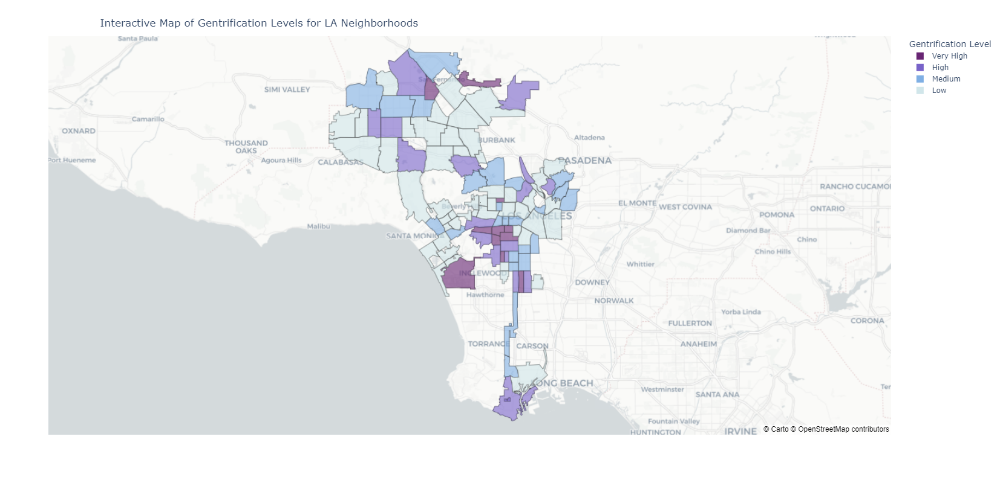

In [316]:
# generate choropleth map of the gentrification levels defined above.
chor_map(data=index_combined_test, 
         color="Gentrification Level", 
         title = "Interactive Map of Gentrification Levels for LA Neighborhoods",
         color_discrete_map={
                "Very High": "#682573",
                "High": "#7863c9",
                "Medium": "#7fafe4",
                "Low": "#d1e6ea"}) 

We now have a way to visualize gentrification through a singular metric/output. Previously, we relied on disparate data sets to assess gentrification separately but now we can progress our overlaying of policing data. However, this is a first pass at creating a gentrification metric and will most likely change quite significantly over the next couple of weeks. We've created a very simple process to classify gentrification levels and as a result, do not necessarily capture the all of the neighborhoods we might expect (this may be correct but we should investigate). It will be important to sift through the neighborhoods and see how they are being classified and then assess whether or not we find them correctly classified based on our datasets in addition to other available information that we can find about the area. We may need to tweak the weights of each of the index rank values based on how important we believe the metrics are in determining gentrification. 